In [5]:
!pip install tensorflow[and-cuda]

  Obtaining dependency information for nvidia-cublas-cu12==12.2.5.6 from https://files.pythonhosted.org/packages/fd/79/02e883f2ec80c831292ec02862212b6131d4688f17376352fceb23bf9a60/nvidia_cublas_cu12-12.2.5.6-py3-none-win_amd64.whl.metadata
  Using cached nvidia_cublas_cu12-12.2.5.6-py3-none-win_amd64.whl.metadata (1.5 kB)
  Obtaining dependency information for nvidia-cuda-cupti-cu12==12.2.142 from https://files.pythonhosted.org/packages/b5/15/1cdeec07d76aaf0c1a740e9c42d334f2f7d48279fa38c998c36e395c3b09/nvidia_cuda_cupti_cu12-12.2.142-py3-none-win_amd64.whl.metadata
  Using cached nvidia_cuda_cupti_cu12-12.2.142-py3-none-win_amd64.whl.metadata (1.6 kB)
  Obtaining dependency information for nvidia-cuda-nvcc-cu12==12.2.140 from https://files.pythonhosted.org/packages/61/e0/2eccdb53a9f14dc8f54f672bbb4d6ead9e477984af334c9fb220598163d2/nvidia_cuda_nvcc_cu12-12.2.140-py3-none-win_amd64.whl.metadata
  Using cached nvidia_cuda_nvcc_cu12-12.2.140-py3-none-win_amd64.whl.metadata (1.5 kB)
  Obtai

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\HP\\anaconda3\\Lib\\site-packages\\~ensorflow\\compiler\\mlir\\quantization\\tensorflow\\python\\pywrap_quantize_model.pyd'
Consider using the `--user` option or check the permissions.



In [2]:
!pip install plotly
!pip install --upgrade nbformat
!pip install nltk
!pip install spacy # spaCy is an open-source software library for advanced natural language processing
!pip install WordCloud
!pip install gensim # Gensim is an open-source library for unsupervised topic modeling and natural language processing
import nltk
nltk.download('punkt')

import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import nltk
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
# import keras
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional
from tensorflow.keras.models import Model
from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False) 
# setting the style of the notebook to be monokai theme  
# this line of code is important to ensure that we are able to see the x and y axes clearly
# If you don't run this code line, you will notice that the xlabel and ylabel on any plot is black on black and it will be hard to see them. 


ERROR: Invalid requirement: '#'


ERROR: Invalid requirement: '#'
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


ModuleNotFoundError: No module named 'gensim'

In [4]:
df_true = pd.read_csv("True.csv")
df_fake = pd.read_csv( "Fake.csv")

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"
...,...,...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016"
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016"
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016"
23479,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016"


In [ ]:
print(df_true.count())
print(df_fake.count())

In [ ]:
df_true.isnull().sum()

In [ ]:
df_fake.isnull().sum()

In [ ]:
df_true['isfake'] = 0
df_fake['isfake'] = 1

In [ ]:
df = pd.concat([df_true, df_fake]).reset_index(drop = True)

In [ ]:
df.drop(columns = 'date', inplace = True)

In [11]:
df['original'] = df['title'] + ' ' + df['text']

In [12]:
df['original'][0]

'As U.S. budget fight looms, Republicans flip their fiscal script WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non

In [13]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [14]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [15]:
stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [17]:
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3 and token not in stop_words:
            result.append(token)
    return result

In [18]:
df['clean'] = df['original'].apply(preprocess) #Very new thing I didn't know that

In [19]:
df['original'][0]

'As U.S. budget fight looms, Republicans flip their fiscal script WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non

In [20]:
print(df['clean'][0])

['budget', 'fight', 'looms', 'republicans', 'flip', 'fiscal', 'script', 'washington', 'reuters', 'head', 'conservative', 'republican', 'faction', 'congress', 'voted', 'month', 'huge', 'expansion', 'national', 'debt', 'cuts', 'called', 'fiscal', 'conservative', 'sunday', 'urged', 'budget', 'restraint', 'keeping', 'sharp', 'pivot', 'republicans', 'representative', 'mark', 'meadows', 'speaking', 'face', 'nation', 'drew', 'hard', 'line', 'federal', 'spending', 'lawmakers', 'bracing', 'battle', 'january', 'return', 'holidays', 'wednesday', 'lawmakers', 'begin', 'trying', 'pass', 'federal', 'budget', 'fight', 'likely', 'linked', 'issues', 'immigration', 'policy', 'november', 'congressional', 'election', 'campaigns', 'approach', 'republicans', 'seek', 'control', 'congress', 'president', 'donald', 'trump', 'republicans', 'want', 'budget', 'increase', 'military', 'spending', 'democrats', 'want', 'proportional', 'increases', 'defense', 'discretionary', 'spending', 'programs', 'support', 'educati

In [27]:
list_of_words = []
for ith_row in df.clean:
    for token_in_ith_row in ith_row:
        list_of_words.append(token_in_ith_row)

In [28]:
len(list_of_words)

9276947

In [29]:
total_unique_words = list(set(list_of_words))

In [30]:
len(total_unique_words)

108704

In [31]:
df['clean_joined'] = df['clean'].apply(lambda x: " ".join(x))

In [32]:
df

,title,text,subject,isfake,original,clean,clean_joined
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,0,"As U.S. budget fight looms, Republicans flip t...","[budget, fight, looms, republicans, flip, fisc...",budget fight looms republicans flip fiscal scr...
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,0,U.S. military to accept transgender recruits o...,"[military, accept, transgender, recruits, mond...",military accept transgender recruits monday pe...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,0,Senior U.S. Republican senator: 'Let Mr. Muell...,"[senior, republican, senator, mueller, washing...",senior republican senator mueller washington r...
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,0,FBI Russia probe helped by Australian diplomat...,"[russia, probe, helped, australian, diplomat, ...",russia probe helped australian diplomat washin...
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,0,Trump wants Postal Service to charge 'much mor...,"[trump, wants, postal, service, charge, amazon...",trump wants postal service charge amazon shipm...
...,...,...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,1,McPain: John McCain Furious That Iran Treated ...,"[mcpain, john, mccain, furious, iran, treated,...",mcpain john mccain furious iran treated sailor...
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,1,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,"[justice, yahoo, settles, mail, privacy, class...",justice yahoo settles mail privacy class actio...
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,1,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,"[sunnistan, allied, safe, zone, plan, territor...",sunnistan allied safe zone plan territorial bo...
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,1,How to Blow $700 Million: Al Jazeera America F...,"[blow, million, jazeera, america, finally, cal...",blow million jazeera america finally calls qui...


<Axes: xlabel='count', ylabel='subject'>

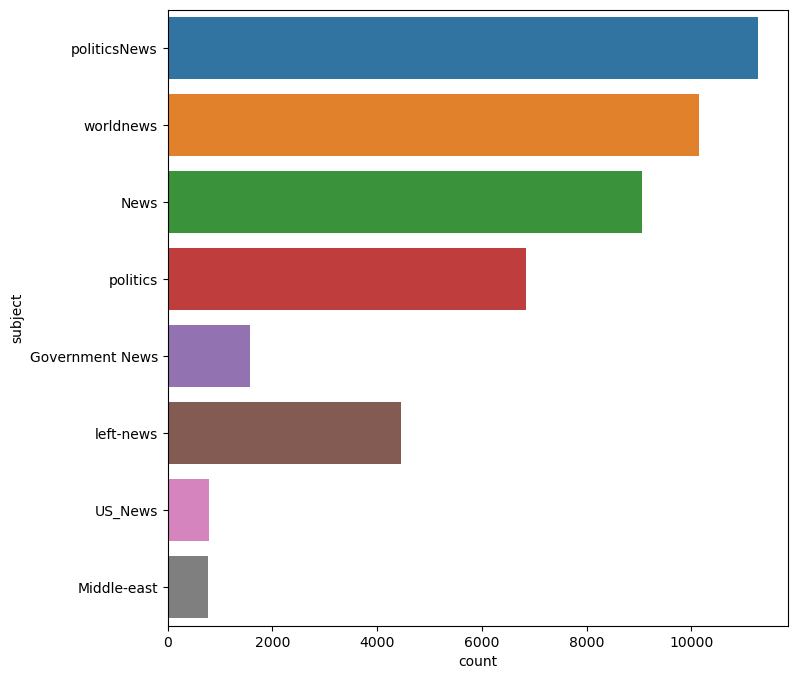

In [28]:
plt.figure(figsize = (8,8))
sns.countplot(y = "subject", data = df)

<Axes: xlabel='count', ylabel='isfake'>

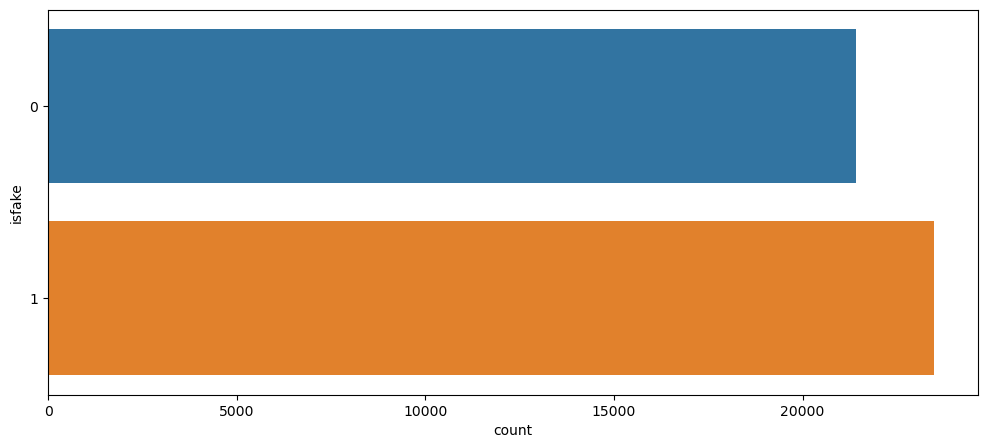

In [29]:
plt.figure(figsize = (12,5))
sns.countplot(y = "isfake", data = df)

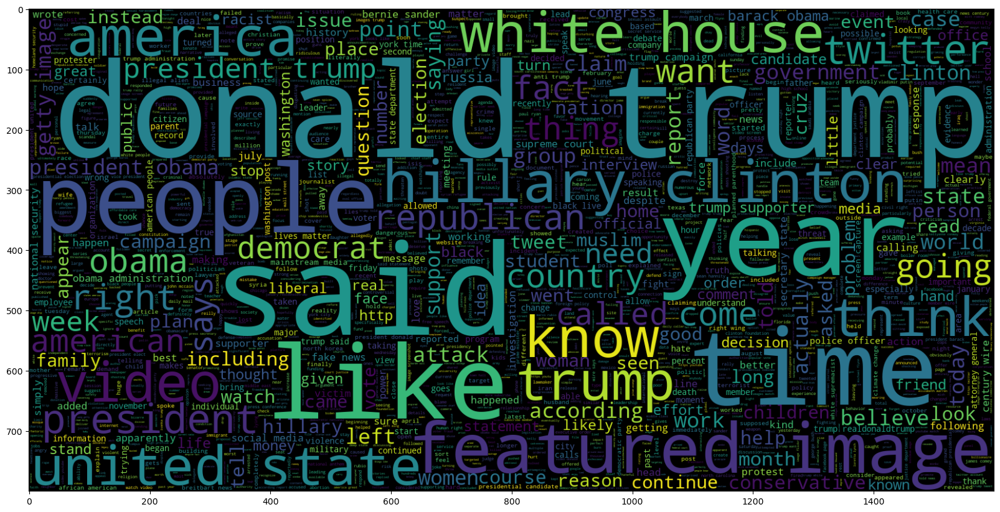

In [70]:
# Plotting word cloud
# Word cloud is a very powerfull visualization for text data
# So if we want to see the importance of each of the word we plot this
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.isfake == 1].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

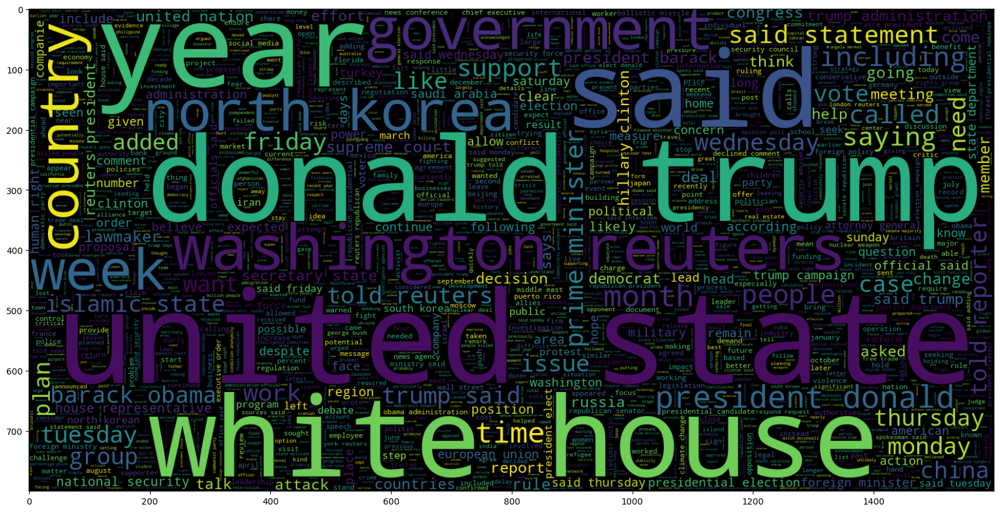

In [71]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.isfake == 0].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

So when the news is true as above, the words that appear bigger are very common

In [33]:
nltk.word_tokenize(df['clean_joined'][0])

['budget',
 'fight',
 'looms',
 'republicans',
 'flip',
 'fiscal',
 'script',
 'washington',
 'reuters',
 'head',
 'conservative',
 'republican',
 'faction',
 'congress',
 'voted',
 'month',
 'huge',
 'expansion',
 'national',
 'debt',
 'cuts',
 'called',
 'fiscal',
 'conservative',
 'sunday',
 'urged',
 'budget',
 'restraint',
 'keeping',
 'sharp',
 'pivot',
 'republicans',
 'representative',
 'mark',
 'meadows',
 'speaking',
 'face',
 'nation',
 'drew',
 'hard',
 'line',
 'federal',
 'spending',
 'lawmakers',
 'bracing',
 'battle',
 'january',
 'return',
 'holidays',
 'wednesday',
 'lawmakers',
 'begin',
 'trying',
 'pass',
 'federal',
 'budget',
 'fight',
 'likely',
 'linked',
 'issues',
 'immigration',
 'policy',
 'november',
 'congressional',
 'election',
 'campaigns',
 'approach',
 'republicans',
 'seek',
 'control',
 'congress',
 'president',
 'donald',
 'trump',
 'republicans',
 'want',
 'budget',
 'increase',
 'military',
 'spending',
 'democrats',
 'want',
 'proportional',
 '

In [34]:
maxlen = -1
for doc in df.clean_joined: #doc is basically one row of column clean_joined or one whole news
    tokens = nltk.word_tokenize(doc)
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print("The maximum number of words in any document (or news) is = ", maxlen)

The maximum number of words in any document (or news) is =  4405


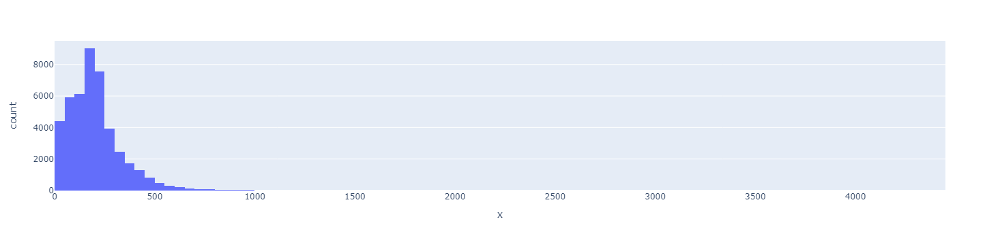

In [35]:
import plotly.express as px 
#Plotly is the best library for interactive graphs unlike seaborn or matplotlib whoese graphs are static
#Use it from now on
fig = px.histogram(x = [len(nltk.word_tokenize(x)) for x in df.clean_joined], nbins = 100)
fig.show()

In [36]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(df.clean_joined, df.isfake, test_size = 0.2)

In [43]:
from nltk import word_tokenize
tokenizer = Tokenizer(num_words = len(total_unique_words))
tokenizer.fit_on_texts(x_train) # Updates internal vocabulary based on a list of texts. This method creates the vocabulary index (word_index) based on word frequency.
# So if you give it something like, "The cat sat on the mat." It will create a dictionary s.t. word_index["the"] = 1; word_index["cat"] = 2 it is word -> index dictionary so every word gets a unique integer value.
train_sequences = tokenizer.texts_to_sequences(x_train) # Transforms each text in texts to a sequence of integers. So it basically takes each word in the text and replaces it with its corresponding integer value from the word_index dictionary.
test_sequences = tokenizer.texts_to_sequences(x_test)

In [38]:
train_sequences

[[1,
  656,
  237,
  1164,
  28470,
  38,
  673,
  3136,
  2322,
  281,
  1182,
  249,
  883,
  38,
  1117,
  38,
  10,
  1,
  2962,
  1021,
  401,
  953,
  656,
  237,
  1447,
  1164,
  28470,
  57118,
  1818,
  2133,
  1,
  237,
  1447,
  375,
  8921,
  14992,
  26185,
  1001,
  3143,
  8921,
  74,
  1939,
  1346,
  880,
  57,
  208,
  212,
  208,
  139,
  3,
  11389,
  28470,
  38,
  237,
  11460,
  59,
  5736,
  782,
  1164,
  28470,
  6909,
  354,
  1880,
  818,
  38,
  1164,
  28470,
  232,
  14992,
  1091,
  6804,
  21,
  38,
  1164,
  28470,
  232,
  38,
  1164,
  28470,
  232,
  1699,
  1830,
  38,
  1164,
  28470,
  387,
  1365,
  5742,
  38,
  1164,
  28470,
  387,
  475,
  5742,
  2877,
  76,
  1,
  474,
  4118,
  14992,
  208,
  8871,
  38,
  1164,
  28470,
  387,
  1,
  673,
  8402,
  2322,
  342,
  4256,
  139,
  2479,
  529,
  13181,
  30579,
  2280,
  3633,
  139,
  213,
  230,
  4039,
  4592,
  3,
  546,
  101,
  208,
  2280,
  445,
  3002,
  2232,
  2828,
  1338,
  2

In [39]:
print(f"The encoding of text:\n{df.clean_joined[0]}\nis:\n{train_sequences[0]}")

The encoding of text:
budget fight looms republicans flip fiscal script washington reuters head conservative republican faction congress voted month huge expansion national debt cuts called fiscal conservative sunday urged budget restraint keeping sharp pivot republicans representative mark meadows speaking face nation drew hard line federal spending lawmakers bracing battle january return holidays wednesday lawmakers begin trying pass federal budget fight likely linked issues immigration policy november congressional election campaigns approach republicans seek control congress president donald trump republicans want budget increase military spending democrats want proportional increases defense discretionary spending programs support education scientific research infrastructure public health environmental protection trump administration willing going increase defense discretionary spending percent meadows chairman small influential house freedom caucus said program democrats saying n

In [224]:
# Add padding can either be maxlen = 4405 or smaller number maxlen = 40 seems to work well based on results
# We are padding sequences because LSTM can only take input size of fix length
padded_train = pad_sequences(train_sequences, maxlen = 40, padding = 'post', truncating = 'post')
padded_test = pad_sequences(test_sequences, maxlen = 40, padding = 'post', truncating = 'post')

In [225]:
for i,doc in enumerate(padded_train[:2]):
    print("The padded encoding for document", i+1," is : ", doc)

The padded encoding for document 1  is :  [ 621 2952   78    1 1463   50 1185 1451    9  617 1695 1988  621   77
 8057   13   10    1   20  605  990   78 1679 1463 1185  841  519  803
 3817    4  392   41 4061 1185  841  519 8309  391    4 3817]
The padded encoding for document 2  is :  [   98  1244     1  6917    10   706  1170  2548  2326   573    30   175
  6381  1244     1  1282   181   147   667   442     1  1021   116 21233
  7059   358  2799 10241  2844  1970   573  1244  4717  1263   147   224
    24   203  7542  7096]


TASK: BUILD AND TRAIN THE MODEL

In [5]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional
from tensorflow.keras.models import Model


#Sequential Model
model = Sequential()

#Embedding Layer

#len(total_unique_words) = 108704
model.add(Embedding(108704, output_dim = 27))

#Bi-Directional RNN/LSTM
model.add(Bidirectional(LSTM(27)))

#Dense Layer
model.add(Dense(128, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))
model.compile(optimizer='adam', loss = 'binary_crossentropy', metrics=['acc'])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, None, 27)          2935008   
                                                                 
 bidirectional_2 (Bidirecti  (None, 54)                11880     
 onal)                                                           
                                                                 
 dense_4 (Dense)             (None, 128)               7040      
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 2954057 (11.27 MB)
Trainable params: 2954057 (11.27 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [228]:
y_train = np.asarray(y_train)

In [229]:
model.fit(padded_train, y_train, batch_size = 128, validation_split = 0.3, epochs = 1)

197/197 [==============================] - 32s 133ms/step - loss: 0.1584 - acc: 0.9362 - val_loss: 0.0114 - val_acc: 0.9972


Assess Trained Model Performance

In [230]:
from tensorflow.keras.models import load_model

model.save("my_lstm_model_high_accuracy.keras")

In [231]:
#Making Prediction based on test data set

#reconstructed_model = load_model("my_lstm_model_high_accuracy.keras")
#reconstructed_pred = reconstructed_model.predict(padded_test)

model = load_model("my_lstm_model_high_accuracy.keras")
pred1 = model.predict(padded_test)

281/281 [==============================] - 7s 10ms/step


In [232]:
#Segmenting prediction of model into 0 or 1 
prediction = []
for i in range(len(pred1)):
    if pred1[i] > 0.5:
        prediction.append(1)
    elif pred1[i] <= 0.5:
        prediction.append(0)

In [233]:
#Estimating the Accuracy based on test input

from sklearn.metrics import accuracy_score

accuracy = accuracy_score(list(y_test), prediction)

print("Model Accuracy : ", accuracy)

Model Accuracy :  0.9969933184855234


In [6]:
from sklearn.metrics import confusion_matrix, classification_report

cm = confusion_matrix(list(y_test), prediction)
plt.figure(figsize = (10,10))
sns.heatmap(cm, annot = True)

NameError: name 'y_test' is not defined